# Image Segmentation

## Mount google drive

and prepare some output folders

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! mkdir /content/drive/MyDrive/colab-outputs/img-segmentation/out

mkdir: cannot create directory ‘/content/drive/MyDrive/colab-outputs/img-segmentation/out’: File exists


## Download and unzip the data

In [ ]:
# ! wget http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz

In [ ]:
# ! mkdir drive/MyDrive/datasets/BSR_bsds500

In [ ]:
# ! mv BSR_bsds500.tgz drive/MyDrive/datasets/BSR_bsds500

In [ ]:
# ! tar -xvzf drive/MyDrive/datasets/BSR_bsds500/BSR_bsds500.tgz -C drive/MyDrive/datasets/BSR_bsds500

Data is unzipped and available at [This link](https://drive.google.com/drive/folders/1-27fqQjJBTlMxrIBzmKzgfhcXkv0rAJl)

Please add this a shortcut to your google drive under a folder called `datasets` to be able to run this notebook.

## Imports

In [4]:
import numpy              as np
import pandas as pd
import matplotlib.pyplot  as plt

import cv2
import os

from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.metrics.cluster import contingency_matrix

from scipy.io import loadmat

## Constants

In [2]:
IN ='/content/drive/MyDrive/imageSegmentation/datasets/BSR/BSDS500/data'
OUT = '/content/drive/MyDrive/img-segmentation/out'

## Exploring Data

Folder tree
```
IN
|_Images
| |_val
| | |_ ....jpg
| | |_ Thumbs.db
| |_train
| | |_ ....jpg
| | |_ Thumbs.db
| |_test
|   |_ ....jpg
|   |_ Thumbs.db
|
|_groundTruth
  |_val
  | |_ ....mat
  |_train
  | |_ ....mat
  |_test
    |_ ....mat
```

(321, 481, 3)


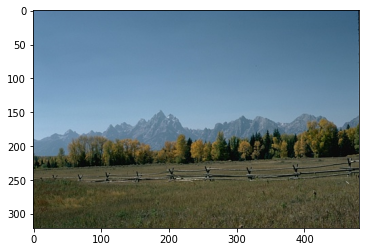

In [ ]:
img = cv2.imread(f'{IN}/images/train/2092.jpg')
plt.imshow(img[:,:,::-1])

print(img.shape)
plt.show()

## Data loaders

In [13]:
def get_img_data(input_folder, subset = None):
  file_names = os.listdir(input_folder)
  images = []
  if subset == None:
    subset = len(file_names)
  for file in sorted(file_names)[:subset]:
    if file.split('.')[-1] != 'jpg':
      continue

    images.append(cv2.imread(f'{input_folder}/{file}'))
  return images

def get_ground_truth_data(input_folder, subset = None):
  file_names = os.listdir(input_folder)
  data = []
  if subset == None:
    subset = len(file_names)
  for file in sorted(file_names)[:subset]:
    if file.split('.')[-1] != 'mat':
      continue

    data.append(loadmat(f'{input_folder}/{file}'))
  return data

In [14]:
x_test = get_img_data(f'{IN}/images/test',subset = 50)
y_test = get_ground_truth_data(f'{IN}/groundTruth/test', subset = 50)

print("test samples: ",len(x_test), len(y_test))

test samples:  50 50


## Display image and ground truth

In [15]:
def disp_img_truth(img,truth,edges=True,gray=False):
  fig = plt.figure(figsize=(30,10))
  n = len(truth['groundTruth'][0])
  ax_img = fig.add_subplot(1,n+1,1)
  ax_img.imshow(img[:,:,::-1]) if not gray else ax_img.imshow(img)
  ax_img.axis('off')

  ax_gt = []
  for i,gt in enumerate(truth['groundTruth'][0]):
    ax_gt.append(fig.add_subplot(1,n+1,i+2))
    if edges:
      ground_truth = gt[0][0][1]
      ax_gt[-1].imshow(-1*ground_truth.astype(np.uint8),cmap='gray')
    else:
      ground_truth = gt[0][0][0]
      ax_gt[-1].imshow(ground_truth.astype(np.uint8))
    ax_gt[-1].axis('off')
    
  plt.show()

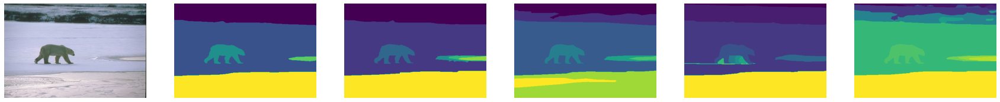

In [ ]:
disp_img_truth(x_test[0],y_test[0],edges=False)

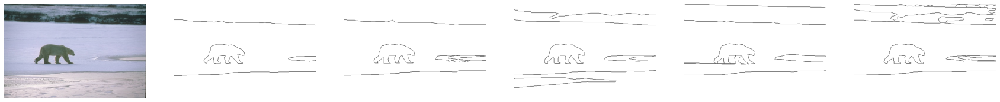

In [ ]:
disp_img_truth(x_test[0],y_test[0],edges=True)

## Segmentation Using K-Means

In [ ]:
def encode_position(img):
  img_indices = np.zeros((img.shape[:-1]+(5,)))
  img_indices[:,:,:3] = img

  row,col = np.indices((img.shape[:2]))
  img_indices[:,:,3] = row / img.shape[0] / 1.5
  img_indices[:,:,4] = col / img.shape[1] / 1.5

  return img_indices


In [ ]:
class K_Means:
  def __init__(self,k=3):
    self.k = k
    self.centroids = None
    self.labels = None

  def fit(self,x_train, max_iter=100):
    # put the data in the right format
    if x_train.ndim != 2:
      x_train = x_train.reshape((-1,x_train.shape[-1]))

    # initialize the centroids
    self.centroids = np.random.choice(x_train.shape[0],self.k,replace=False)
    self.centroids = x_train[self.centroids]

    it = 0
    while it < max_iter:
      it += 1
      # calculate the distance between each point and each centroid
      dist = np.linalg.norm(x_train[:,np.newaxis]-self.centroids[np.newaxis],axis=-1)
      # assign each point to the closest centroid
      self.labels = np.argmin(dist,axis=-1)
      # calculate the new centroids
      new_centroids = np.zeros_like(self.centroids)
      for i in range(self.k):
        # calculate the mean of all points assigned to the centroid
        new_centroids[i] = np.mean(x_train[self.labels==i],axis=0)
      # check the stopping condition
      if np.all(new_centroids == self.centroids):
        break
      self.centroids = new_centroids

  def predict(self,x_test):
    # put the data in the right format
    if x_test.ndim != 2:
      x_test = x_test.reshape((-1,x_test.shape[-1]))

    # calculate the distance between each point and each centroid
    dist = np.linalg.norm(x_test[:,np.newaxis]-self.centroids[np.newaxis],axis=-1)
    # assign each point to the closest centroid
    return np.argmin(dist,axis=-1)


In [ ]:
def k_means(k, img, position = False):
  fitted = K_Means(k)
  img = encode_position(img/255.) if position else (img / 255.)
  fitted.fit(img)
  labels = fitted.predict(img)

  return labels.reshape(img.shape[:2])

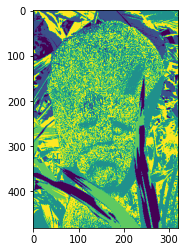

In [ ]:
plt.imshow(k_means(5,x_test[5]))

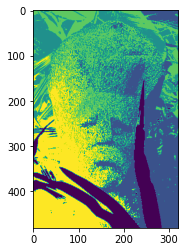

In [ ]:
plt.imshow(k_means(5,x_test[5],position = True))

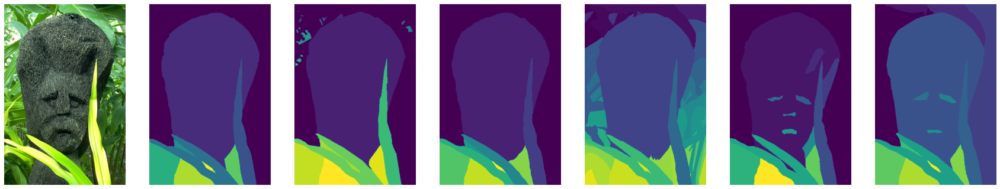

In [ ]:
disp_img_truth(x_test[5],y_test[5],edges=False)

### Trying different Ks and saving as colored images

In [ ]:
def get_all_labels(X, n = [3,5,7,9,11], position = False):
  y_pred = []
  for x in X:
    y = []
    for k in n:
      y.append(k_means(k,x,position = position))
    y_pred.append(y)
  return y_pred  

In [ ]:
# y_pred = get_all_labels(x_test)

In [ ]:
def save_all_labels(y_pred,dir):
  for i in range(len(y_pred)):
    path = f'{dir}/{i}'
    # os.mkdir(path)
    for j,y in enumerate(y_pred[i]):
      y = 255. * y / max(np.max(y),1)
      cv2.imwrite(f'{path}/{j}.png',y)

  

In [ ]:
#! mkdir /content/drive/MyDrive/colab-outputs/img-segmentation/out/test

In [ ]:
# save_all_labels(y_pred, f'{OUT}/test')

In [ ]:
# np.save(f'{OUT}/test/y_pred',np.array(y_pred,dtype=object))

In [5]:
y_pred = np.load(f'{OUT}/test/y_pred.npy',allow_pickle=True)
y_pred[0].shape

(5,)

## Performing max-matching to assign correct labels to clusters

In [ ]:
# (k clusters, i images, m ground truths, contingency shape)
def contingency(y_pred,y_true):
    contingency_matrices = np.zeros((len(y_pred[0]),len(y_pred),),dtype=object)
    for k in range(len(y_pred[0])):
    # for each k in [3,5,7,9,11]
        for i in range(len(y_pred)):
            # for each image i
            temp = np.zeros((len(y_true[i]['groundTruth'][0]),),dtype = object)
            for m, gt in enumerate(y_true[i]['groundTruth'][0]):
                # each image i has m ground truths
                ground_truth = gt[0][0][0]
                temp[m] = contingency_matrix(ground_truth, y_pred[i][k])
            contingency_matrices[k,i] = temp.copy()
            del temp
    return contingency_matrices

In [ ]:
# con = contingency(y_pred,y_test)
# con[0,1][0]

In [ ]:
def max_match_one_img(contingency, y_true,y_pred):
    y_new = y_pred.copy()
    true_unique = np.unique(y_true)
    pred_unique = np.unique(y_pred)
    mapping = np.zeros(pred_unique.shape+ (2,))
    for c in range(contingency.shape[-1]):
        best_match = np.argmax(contingency[:,c])
        y_new[y_pred == pred_unique[c]] = true_unique[best_match]
        mapping[c] = [pred_unique[c],true_unique[best_match]]
    return y_new, mapping

In [ ]:
def max_match_all(contingencies,y_true,y_pred):
    y_pred_matched = np.zeros(y_pred.shape , dtype=object)
    for k in range(len(y_pred[0])):
    # for each k in [3,5,7,9,11]
        for i in range(len(y_pred)):
            # for each image i
            y_pred_matched[i,k] = np.zeros((len(y_true[i]['groundTruth'][0]),) + y_pred[i,k].shape)
            for m, gt in enumerate(y_true[i]['groundTruth'][0]):
                # each image i has m ground truths
                ground_truth = gt[0][0][0]
                contingency = contingencies[k,i][m]
                y_pred_matched[i,k][m] = max_match_one_img(contingency,ground_truth,y_pred[i,k])[0]
    return y_pred_matched

In [6]:
# y_pred_matched = max_match_all(con,y_test,y_pred)
# np.save(f'{OUT}/test/y_pred_matched',y_pred_matched)
y_pred_matched = np.load(f'{OUT}/test/y_pred_matched.npy',allow_pickle=True)

## Computing F-measure

In [7]:
def f_measure_all(y_true,y_pred):
    f_measure = np.zeros(y_pred.shape , dtype=object)
    avg = 0
    count = 0
    for k in range(len(y_pred[0])):
    # for each k in [3,5,7,9,11]
        for i in range(len(y_pred)):
            # for each image i
            f_measure[i,k] = np.zeros((len(y_true[i]['groundTruth'][0])+1,))
            for m, gt in enumerate(y_true[i]['groundTruth'][0]):
                # each image i has m ground truths
                ground_truth = gt[0][0][0]
                f_measure[i,k][m] = f1_score(ground_truth.reshape((-1,)),y_pred[i,k][m].reshape((-1,)),average='macro')
                avg = avg + f_measure[i,k][m]
                count = count + 1
            f_measure[i,k][-1] = np.mean(f_measure[i,k][:-1]) # average
    return f_measure, avg / count



In [16]:
f_measure, avg = f_measure_all(y_test,y_pred_matched)
np.save(f'{OUT}/test/f_measure',np.array((f_measure,avg),dtype=object))
# f_measure, avg = np.load(f'{OUT}/test/f_measure.npy',allow_pickle=True)
avg

0.1777883405177822

## Computing conditional entropy

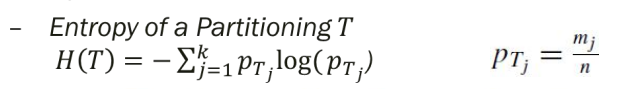

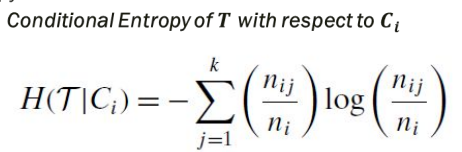

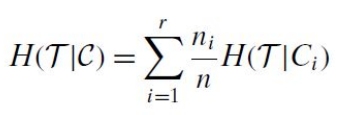

In [ ]:
def conditional_entropy(y_true, y_pred):
    n = y_pred.shape[0]
    cond_ent = 0
    for c in np.unique(y_pred):
        # for each cluster c in clustering
        nc = (y_pred == c).shape[0]
        ent = 0
        for k in np.unique(y_true):
            # for each label in the cluster
            nkc = (y_true[y_pred == c] == k).shape[0]
            p = nkc / nc
            ent = ent + -1 * p * np.log(p)
        cond_ent = cond_ent + ent * nc / n
    return cond_ent

def conditional_entropy_all(y_true,y_pred):
    ent = np.zeros(y_pred.shape , dtype=object)
    avg = 0
    count = 0
    for k in range(len(y_pred[0])):
    # for each k in [3,5,7,9,11]
        for i in range(len(y_pred)):
            # for each image i
            ent[i,k] = np.zeros((len(y_true[i]['groundTruth'][0])+1,))
            for m, gt in enumerate(y_true[i]['groundTruth'][0]):
                # each image i has m ground truths
                ground_truth = gt[0][0][0]
                ent[i,k][m] = conditional_entropy(ground_truth.reshape((-1,)),y_pred[i,k][m].reshape((-1,)))
                avg = avg + ent[i,k][m]
                count = count + 1
            ent[i,k][-1] = np.mean(ent[i,k][:-1]) # average
    return ent, avg / count

In [9]:
# conditional_ent, avg = conditional_entropy_all(y_test,y_pred_matched)
# np.save(f'{OUT}/test/conditional_entropy',np.array((conditional_ent,avg),dtype=object))
conditional_ent, avg = np.load(f'{OUT}/test/conditional_entropy.npy',allow_pickle=True)
avg

19.222027735532798

## Good and bad results

In [17]:
def get_avg_per_img(metric):
    avg = np.zeros( (metric.shape[0], metric.shape[1]),dtype=np.float32)
    for ii, i in enumerate(metric):
        for ik, k in enumerate(i):
            avg[ii,ik] = k[-1]
    return avg
avg_f_measures = get_avg_per_img(f_measure)
avg_entropy = get_avg_per_img(conditional_ent)

In [18]:
avg_f_measures, avg_entropy

(array([[0.20025763, 0.28088588, 0.3351878 , 0.31099516, 0.3576946 ],
        [0.18657969, 0.22069812, 0.23361991, 0.07352786, 0.25088155],
        [0.38035175, 0.38313246, 0.42087126, 0.4729108 , 0.4861679 ],
        [0.16458443, 0.18857662, 0.19524966, 0.24756254, 0.23253654],
        [0.12401793, 0.159595  , 0.16559213, 0.17192543, 0.16877383],
        [0.09018138, 0.1238526 , 0.1532038 , 0.15647346, 0.17033714],
        [0.04474494, 0.05031892, 0.05184147, 0.05435968, 0.05517804],
        [0.2306075 , 0.23111832, 0.23328309, 0.2354141 , 0.26479682],
        [0.1451505 , 0.16138501, 0.19304082, 0.22040507, 0.23197478],
        [0.15834261, 0.16360234, 0.1723262 , 0.1727447 , 0.19285347],
        [0.08933916, 0.09769211, 0.10891172, 0.10611916, 0.1171444 ],
        [0.12265041, 0.14435327, 0.18741813, 0.21836892, 0.22189046],
        [0.16909258, 0.2478994 , 0.30054396, 0.32505438, 0.3333766 ],
        [0.2922683 , 0.3229981 , 0.39805973, 0.40292668, 0.42046043],
        [0.4523246 ,

In [19]:
f_measure_sorted = np.argsort(avg_f_measures,axis=0)
entropy_sorted = np.argsort(avg_entropy,axis=0)

best_and_worst_f = (np.take_along_axis(avg_f_measures,f_measure_sorted[-5:],axis=0) , np.take_along_axis(avg_f_measures,f_measure_sorted[:5],axis=0))

best_and_worst_ent = (np.take_along_axis(avg_entropy,entropy_sorted[:5],axis=0) , np.take_along_axis(avg_entropy,entropy_sorted[-5:],axis=0))

best_and_worst_ent, best_and_worst_f

((array([[0.        , 0.5277109 , 0.        , 0.        , 0.        ],
         [0.        , 1.5779799 , 0.        , 0.39591792, 0.        ],
         [0.        , 1.5986636 , 0.        , 1.3832912 , 0.37673497],
         [0.19474137, 2.0752451 , 0.44703546, 2.0857055 , 1.7915416 ],
         [0.567996  , 2.6857648 , 1.3441818 , 2.8097749 , 2.8001869 ]],
        dtype=float32),
  array([[27.403177, 41.11736 , 42.829327, 45.438416, 49.583378],
         [28.770435, 41.95236 , 57.275078, 59.119404, 58.597046],
         [40.828648, 48.269882, 58.660206, 61.942055, 65.439476],
         [41.738293, 50.529922, 59.79702 , 67.54087 , 66.621864],
         [51.161804, 51.914936, 63.323586, 71.58237 , 71.70638 ]],
        dtype=float32)),
 (array([[0.32163212, 0.3557749 , 0.39805973, 0.42861274, 0.47266695],
         [0.36105445, 0.38313246, 0.42087126, 0.45856357, 0.47532406],
         [0.38035175, 0.43170592, 0.46149734, 0.4729108 , 0.4861679 ],
         [0.4062462 , 0.46378922, 0.5138878 , 0.512

In [25]:
def disp_all_k(y_pred):
    n = len(y_pred)
    fig = plt.figure(figsize=(30,10))
    for i in range(n):
        ax = fig.add_subplot(1,n,i+1)
        ax.imshow(y_pred[i])


### Best entropy at k = 3

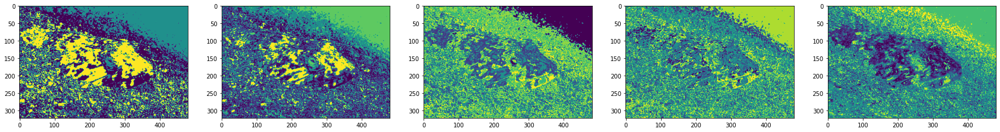

In [ ]:
disp_all_k(y_pred[entropy_sorted[0,0]])

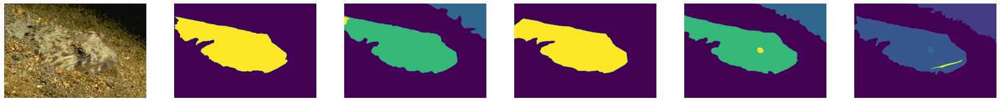

In [ ]:
disp_img_truth(x_test[entropy_sorted[0,0]],y_test[entropy_sorted[0,0]],edges=False)

### Best entropy at k = 5

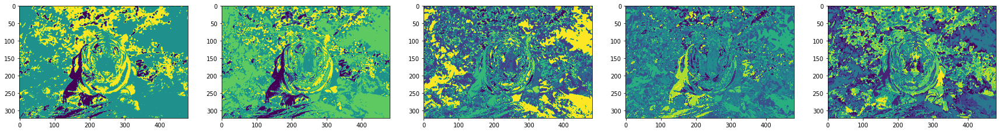

In [26]:
disp_all_k(y_pred[entropy_sorted[0,1]])

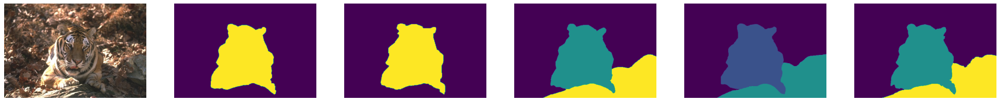

In [27]:
disp_img_truth(x_test[entropy_sorted[0,1]],y_test[entropy_sorted[0,1]],edges=False)

### Best entropy at k = 7

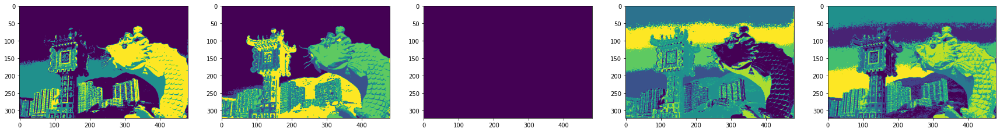

In [28]:
disp_all_k(y_pred[entropy_sorted[0,2]])

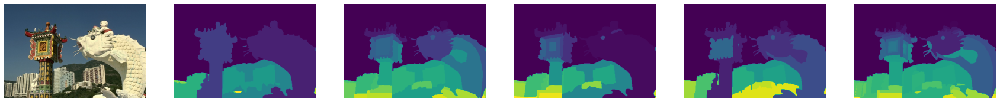

In [22]:
disp_img_truth(x_test[entropy_sorted[0,2]],y_test[entropy_sorted[0,2]],edges=False)

### Best entropy at k = 9

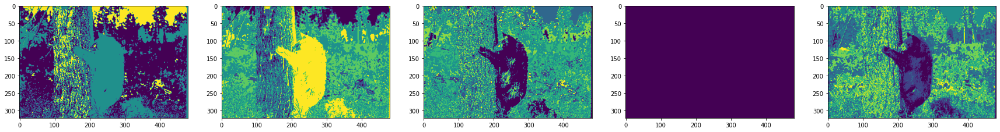

In [29]:
disp_all_k(y_pred[entropy_sorted[0,3]])

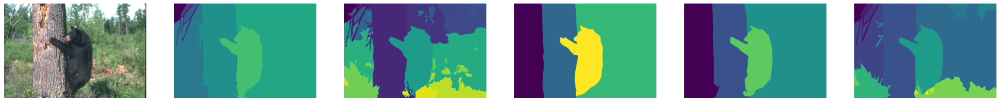

In [30]:
disp_img_truth(x_test[entropy_sorted[0,3]],y_test[entropy_sorted[0,3]],edges=False)

### Best entropy at k = 11

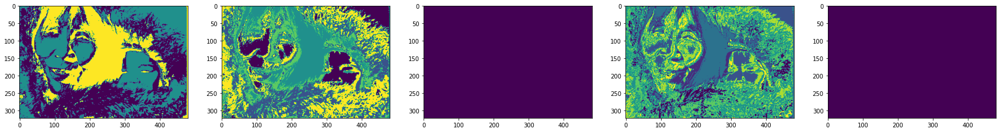

In [31]:
disp_all_k(y_pred[entropy_sorted[0,4]])

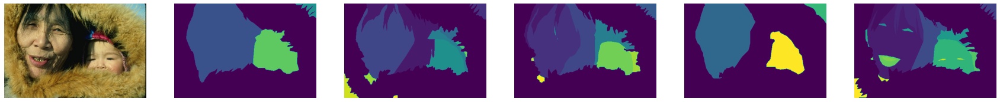

In [32]:
disp_img_truth(x_test[entropy_sorted[0,4]],y_test[entropy_sorted[0,4]],edges=False)

### Best F-measure at k = 3

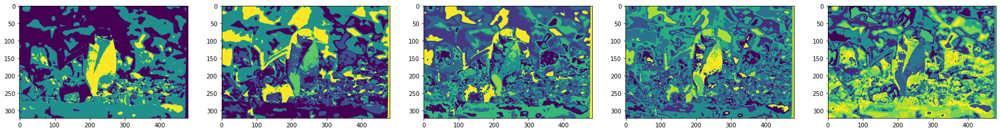

In [ ]:
disp_all_k(y_pred[f_measure_sorted[-1,0]])

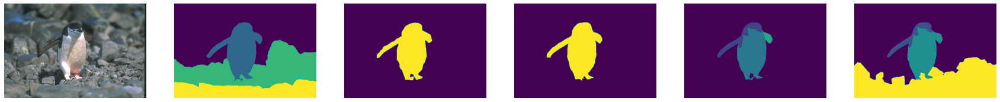

In [ ]:
disp_img_truth(x_test[f_measure_sorted[-1,0]],y_test[f_measure_sorted[-1,0]],edges=False)

### Best F-measure at k = 5

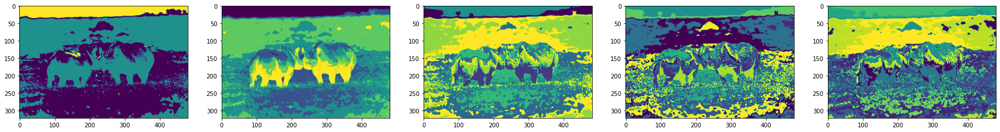

In [33]:
disp_all_k(y_pred[f_measure_sorted[-1,1]])

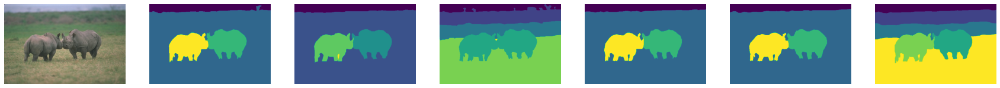

In [34]:
disp_img_truth(x_test[f_measure_sorted[-1,1]],y_test[f_measure_sorted[-1,1]],edges=False)

### Best F-measure at k = 7

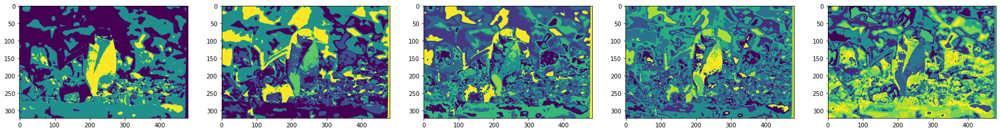

In [35]:
disp_all_k(y_pred[f_measure_sorted[-1,2]])

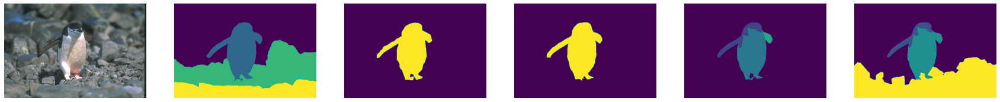

In [36]:
disp_img_truth(x_test[f_measure_sorted[-1,2]],y_test[f_measure_sorted[-1,2]],edges=False)

### Best F-measure at k = 9

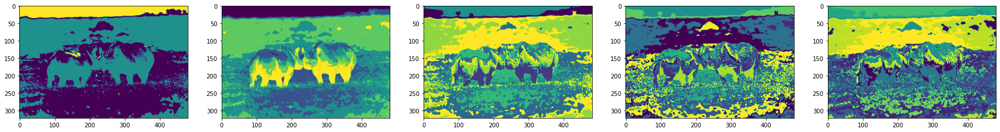

In [37]:
disp_all_k(y_pred[f_measure_sorted[-1,3]])

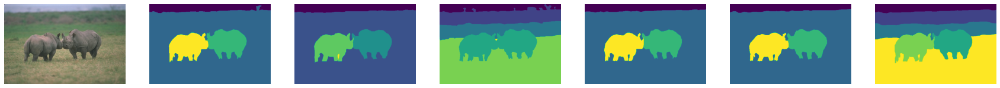

In [38]:
disp_img_truth(x_test[f_measure_sorted[-1,3]],y_test[f_measure_sorted[-1,3]],edges=False)

### Best F-measure at k = 11

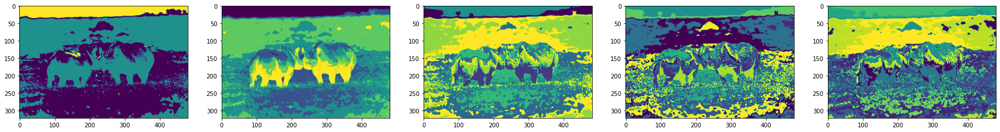

In [39]:
disp_all_k(y_pred[f_measure_sorted[-1,4]])

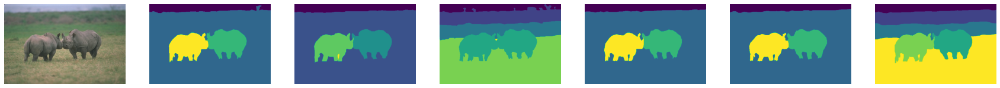

In [40]:
disp_img_truth(x_test[f_measure_sorted[-1,4]],y_test[f_measure_sorted[-1,4]],edges=False)

### Worst entropy at k = 3

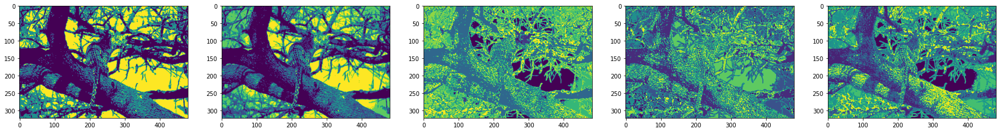

In [ ]:
disp_all_k(y_pred[entropy_sorted[-1,0]])

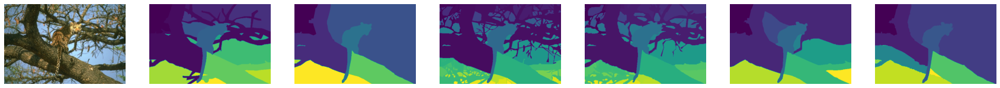

In [ ]:
disp_img_truth(x_test[entropy_sorted[-1,0]],y_test[entropy_sorted[-1,0]],edges=False)

### Worst entropy at k = 5

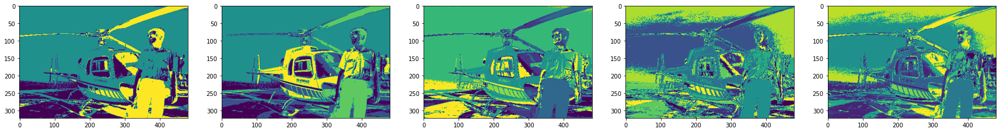

In [41]:
disp_all_k(y_pred[entropy_sorted[-1,1]])

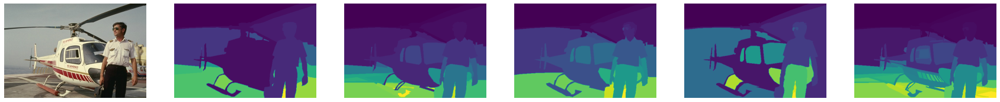

In [42]:
disp_img_truth(x_test[entropy_sorted[-1,1]],y_test[entropy_sorted[-1,1]],edges=False)


### Worst entropy at k = 7

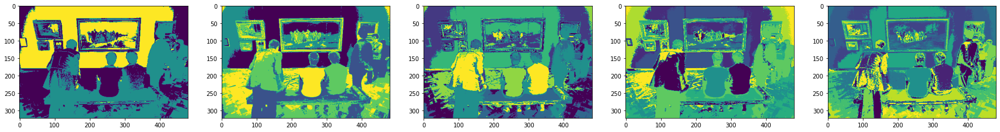

In [43]:
disp_all_k(y_pred[entropy_sorted[-1,2]])

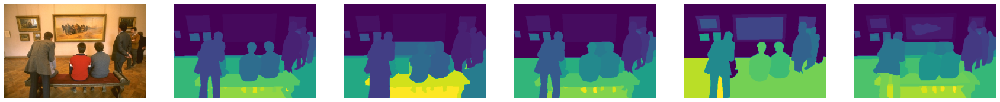

In [44]:
disp_img_truth(x_test[entropy_sorted[-1,2]],y_test[entropy_sorted[-1,2]],edges=False)

### Worst entropy at k = 9

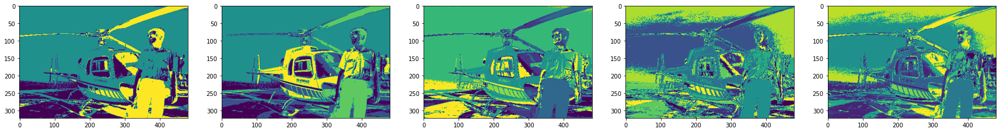

In [45]:
disp_all_k(y_pred[entropy_sorted[-1,3]])

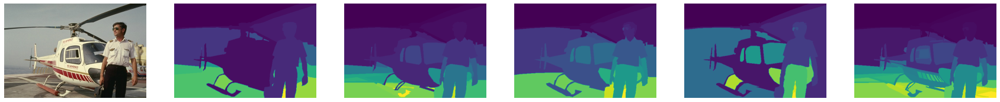

In [46]:
disp_img_truth(x_test[entropy_sorted[-1,3]],y_test[entropy_sorted[-1,3]],edges=False)

### Worst entropy at k = 11

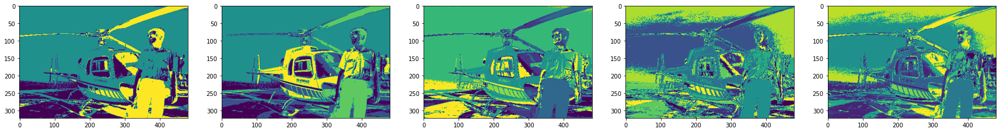

In [47]:
disp_all_k(y_pred[entropy_sorted[-1,4]])

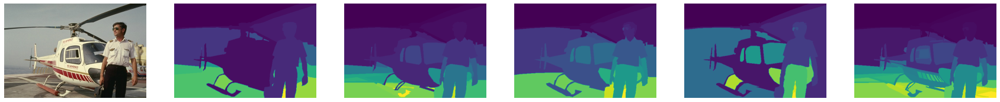

In [48]:
disp_img_truth(x_test[entropy_sorted[-1,4]],y_test[entropy_sorted[-1,4]],edges=False)

### Worst F-measure at k = 3

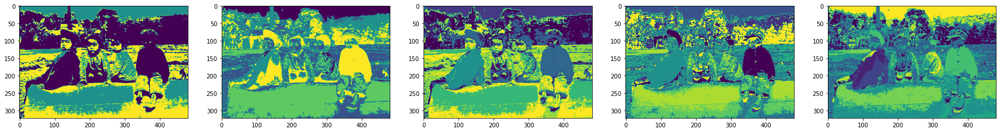

In [ ]:
disp_all_k(y_pred[f_measure_sorted[0,0]])

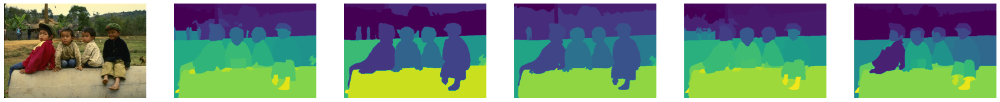

In [ ]:
disp_img_truth(x_test[f_measure_sorted[0,0]],y_test[f_measure_sorted[0,0]],edges=False)

### Worst F-measure at k = 5

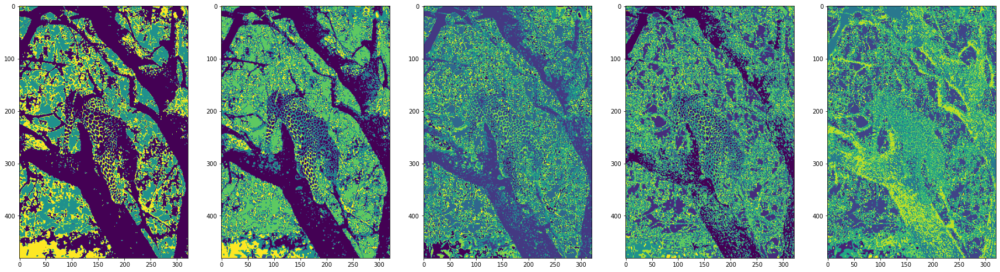

In [49]:
disp_all_k(y_pred[f_measure_sorted[0,1]])

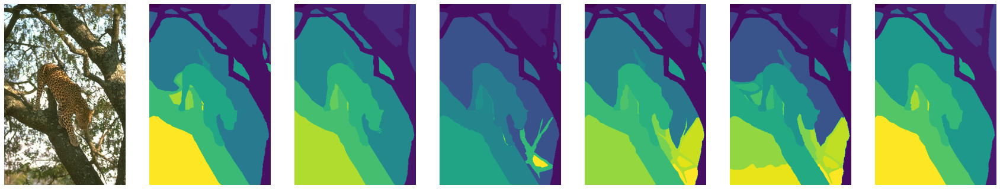

In [50]:
disp_img_truth(x_test[f_measure_sorted[0,1]],y_test[f_measure_sorted[0,1]],edges=False)

### Worst F-measure at k = 7

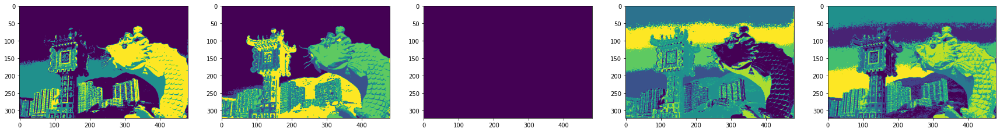

In [51]:
disp_all_k(y_pred[f_measure_sorted[0,2]])

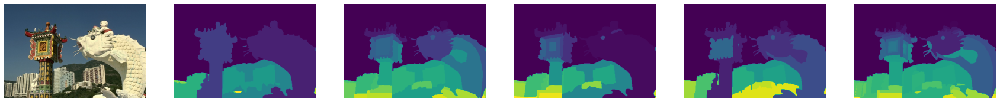

In [52]:
disp_img_truth(x_test[f_measure_sorted[0,2]],y_test[f_measure_sorted[0,2]],edges=False)

### Worst F-measure at k = 9

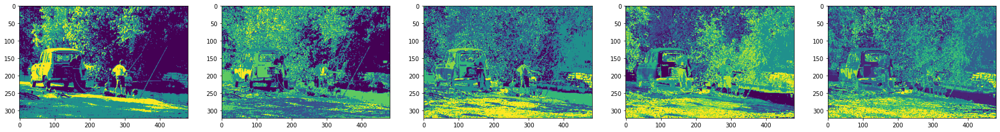

In [53]:
disp_all_k(y_pred[f_measure_sorted[0,3]])

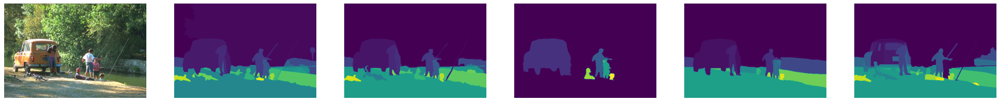

In [54]:
disp_img_truth(x_test[f_measure_sorted[0,3]],y_test[f_measure_sorted[0,3]],edges=False)

### Worst F-measure at k = 11

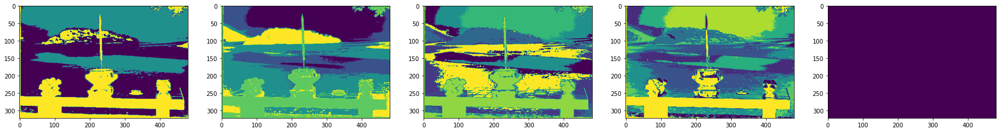

In [55]:
disp_all_k(y_pred[f_measure_sorted[0,4]])

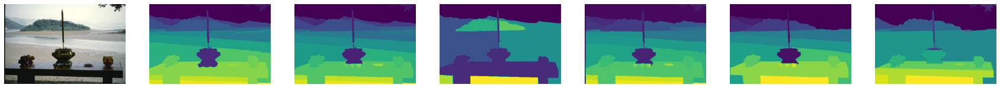

In [56]:
disp_img_truth(x_test[f_measure_sorted[0,4]],y_test[f_measure_sorted[0,4]],edges=False)